<a href="https://colab.research.google.com/github/PushyamiB/PushyamiB/blob/circleci-project-setup/EasyOCR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install easyocr

In [ ]:
from PIL import Image
import numpy as np
import pandas as pd
import cv2
from IPython.display import Image
from pylab import rcParams
import matplotlib.pyplot as plt
import easyocr
rcParams['figure.figsize']=15,15

In [ ]:
#function for display images
def display(im_data):
    dpi = 80
    height, width  = im_data.shape[:2]
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(im_data, cmap='gray')
    plt.show()

In [ ]:
#function for creating dataframe without probability

def data_frame(output_ocr,col_name):
    data_easy=[]
    for i in range(len(output_ocr)):
        data_easy.append(output_ocr[i][1])
    data = {
      col_name: data_easy
        }
    df = pd.DataFrame(data)
    return df

In [ ]:
def thin_font(image):
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [ ]:
#function for increase thickness of text
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [ ]:
# function for remove noise
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [ ]:
reader = easyocr.Reader(['en'])

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


In [ ]:
file_name = '/content/WhatsApp Image 2022-02-02 at 6.10.42 AM.jpeg'
img=cv2.imread(file_name)

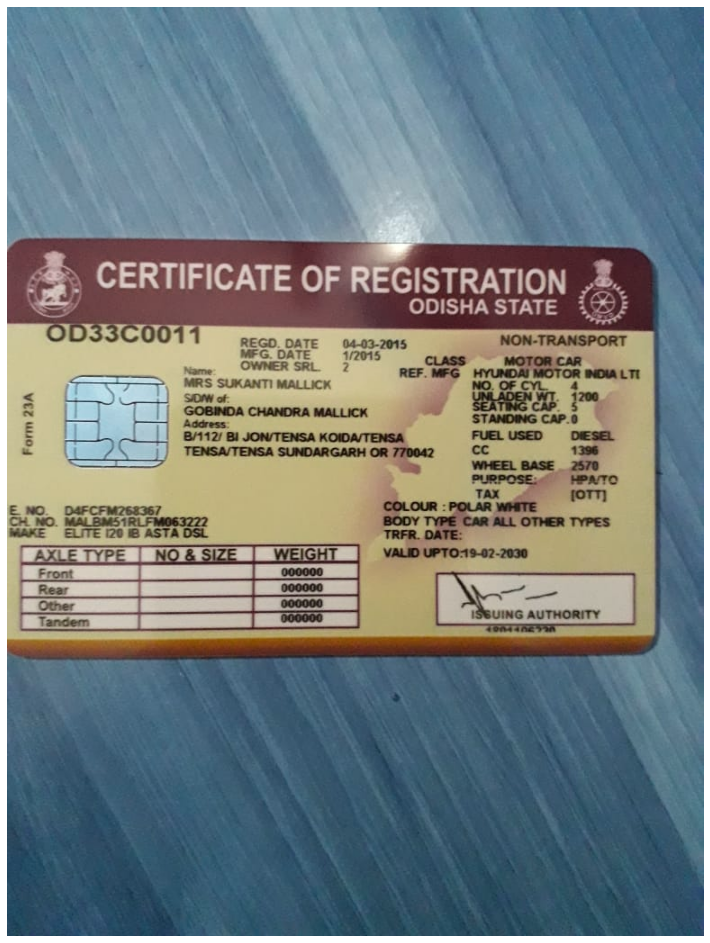

In [ ]:
display(img)

In [ ]:
# processing on original image
output_org = reader.readtext(file_name)
data_org=data_frame(output_org, "Original")
print(list(data_org['Original']))
#data_org_p=data_frame_p(output_org, "Original")

['CERTIFICATE OF REGISTRATION', 'ODISHA STATE', 'OD33C0011', 'REGD', '0L03-2015', 'NON-TRANSPORT', 'G', 'DaHEE', '1n015', 'CLASS', 'Motor car', 'OwER SRL', 'REF.MFG', 'Hudnmotor WDU LtI', 'MRS SUKANTI MALLICK', 'O6Cn', '3', 'spm of', 'E88', '1200', 'GOBINda CHANDRA MALLiCK', 'STANDING CAP.0', 'Rodess"', '1', 'B/112 BI JONTENSA KOIDAITENSA', 'FUEL USED', 'DisEL', 'TENSNTENSA SUNDARGARH OR 770042', 'cc', '4396', 'WHEEL BAS€', '2570', 'PyrPosE', 'Lparo', 'TAI', '[OT]', '#', 'No.', 'DFCL758367', 'COLOUR', 'POLAR WHTE', 'KO.', 'E', 'S1RLF', '5783', 'BODY Type CAR ALL Other Types', 'LE', '7o BaSTA', 'TRFR_', 'DATE:', 'EETYPE', 'NoRSzE', 'WEGHI', 'VALID Upt079-02-2030', 'Fen', 'Oooooo', 'Real', 'Ooo00o', 'Cuen', '0o00o0', 'oo060O', 'ISBUING Authority', 'lancem']


In [ ]:
# invert images
inverted_image = cv2.bitwise_not(img)
inverted_image = thin_font(inverted_image)
#save into temp folder
cv2.imwrite("temp/inverted.jpg", inverted_image)

# change into gray image
gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2.imwrite("temp/gray.jpg", gray)

# change into b&w image, remove the noise and increase the thickness
(T, bw) = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
cv2.imwrite("temp/bw.jpg", bw)
no_noise = noise_removal(bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)
bw_thick=thick_font(no_noise)
cv2.imwrite("temp/bw_thick.jpg", bw_thick)

#  change into saturated image
sat = cv2.detailEnhance(img, sigma_s=5, sigma_r=0.15)
cv2.imwrite("temp/dst.jpg", sat)

True

In [ ]:
#output value for inverted image
output_inv = reader.readtext(inverted_image)
data_inv=data_frame(output_inv, "Inverted")
data_inv_p=data_frame_p(output_inv, "Inverted")

#output value for gray image
output_gray = reader.readtext(gray)
data_gray=data_frame(output_gray, "Gray")
data_gray_p=data_frame_p(output_gray, "Gray")

#output value for black&white image
output_bw = reader.readtext(bw)
data_bw=data_frame(output_bw, "Black&white")
data_bw_p=data_frame_p(output_bw, "Black&white")

#output value for saturated image
output_sat = reader.readtext(sat)
data_sat=data_frame(output_sat, "Saturated")
data_sat_p=data_frame_p(output_sat, "Saturated")

In [ ]:
#bounding_box(output_inv,inverted_image)

In [ ]:
# sat1 = cv2.detailEnhance(img, sigma_s=15, sigma_r=0.65)
# cv2.imwrite("temp/dst1.jpg", sat1)

In [ ]:
#data_sat

In [ ]:
horizontal_concat = pd.concat([data_org, data_inv, data_gray, data_sat, data_bw], axis=1)
#horizontal_concat_p = pd.concat([data_org_p, data_inv_p, data_gray_p, data_sat_p, data_bw_p,data_bw_p_thick], axis=1)

In [ ]:
horizontal_concat

,Original,Inverted,Gray,Saturated,Black&white
0,Declarative Sentence,Declarative Sentence,Declarative Sentence,Declarative Sentence,Declarative Sentence
1,makes a statementand ends in a period,makes a statement and ends in a period,makes a statementand ends in a period,makes a statementand ends in a period,makes a statementand ends in a period
2,like freedom,like freedom:,like freedom:,like freedom:,like freedom:
3,declarative sentence,declaratlve sentence,declarative sentence,declarative sentence,declarative sentence
4,(makes,(makes,(makes,(makes,(males
5,statement),statement),statement),statement),statement}
6,Isn't this great?,Isn't this great?,Isn't this great?,Isn't this great?,Isn't this great?
7,Catch me if you can:,Catch me if you can.,Catch me if you can.,Catch me if you can:,Catch me if You can:
8,Iam freel,am freel,Iam freel,Iam freel,am freel
9,interrogative,Intorroratlva,interrogative,interrogative,interrogative


In [ ]:
#data_gray

In [ ]:
# Open a typical 24 bit color image. For this kind of image there are
# 8 bits (0 to 255) per color channel
#img = cv2.imread('rc/r1.jpg')
path='rc/r1.jpg'# mandrill reference image from USC SIPI
img = cv2.imread(path)
#img_g= cv2.imread(path, cv2.IMREAD_GRAYSCALE)
#s = 512
#img = cv2.resize(img, (s,s), 0, 0, cv2.INTER_AREA)

def apply_brightness_contrast(input_img, brightness = 0, contrast = 0):
    
    if brightness != 0:
        if brightness > 0:
            shadow = brightness
            highlight = 255
        else:
            shadow = 0
            highlight = 255 + brightness
        alpha_b = (highlight - shadow)/255
        gamma_b = shadow
        
        buf = cv2.addWeighted(input_img, alpha_b, input_img, 0, gamma_b)
    else:
        buf = input_img.copy()
    
    if contrast != 0:
        f = 131*(contrast + 127)/(127*(131-contrast))
        alpha_c = f
        gamma_c = 127*(1-f)
        
        buf = cv2.addWeighted(buf, alpha_c, buf, 0, gamma_c)

    return buf

In [ ]:
#     out[row:row+s, col:col+s] = apply_brightness_contrast(img, b, c)
out = apply_brightness_contrast(img, 0, 100)

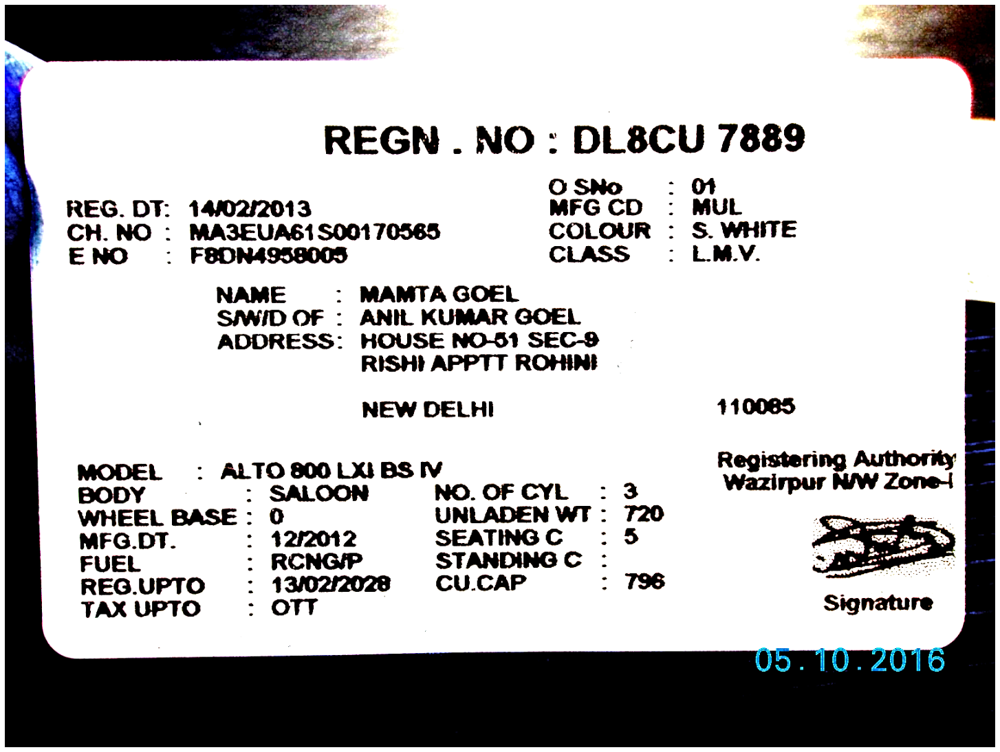

In [ ]:
output_bw_thick= thin_font(out)
#  change into saturated image
output_bw_thick = cv2.detailEnhance(output_bw_thick, sigma_s=10, sigma_r=0.15)
display(output_bw_thick)

In [ ]:
#output_bw_thick= thick_font(out)
# output_bw_thick= reader.readtext(output_bw_thick)

# data_bw_thick=data_frame(output_bw_thick, "Blwhite")
# data_bw_p_thick=data_frame_p(output_bw_thick, "Black&white_thick")

output_org = reader.readtext(img)
data_org=data_frame(output_org, "Original")
data_org_p=data_frame_p(output_org, "Original")


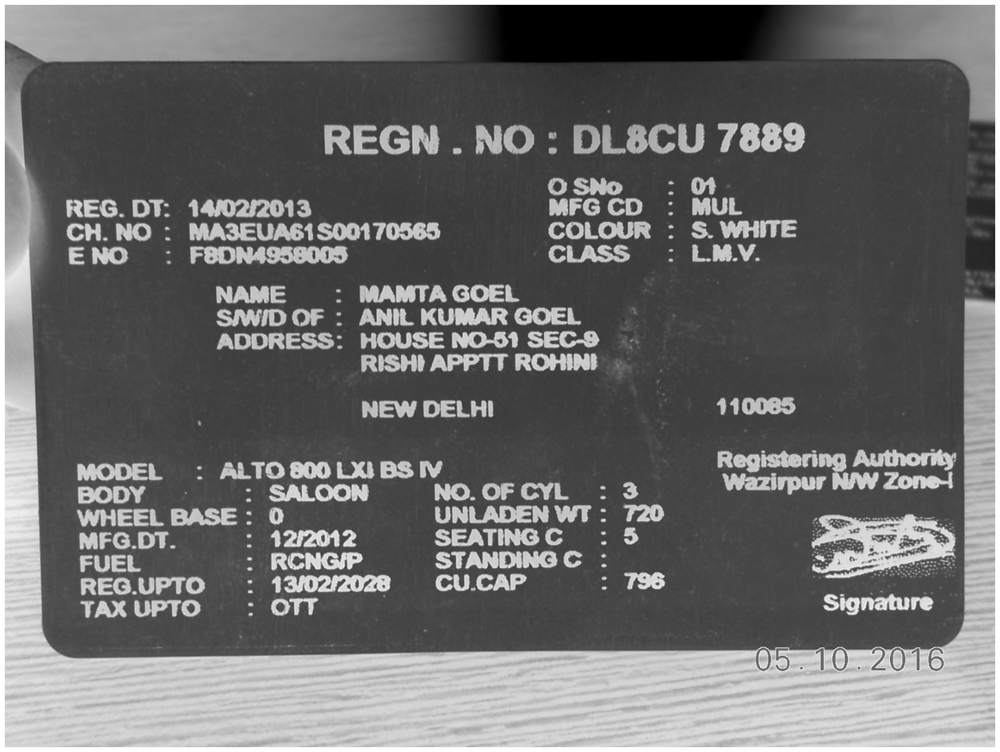

In [ ]:
gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
out = cv2.bitwise_not(gray)
#out = apply_brightness_contrast(gray, 0, 24)
#out= thin_font(out)
display(out)
output_bw_thick= reader.readtext(out)

data_bw_thick=data_frame(output_bw_thick, "Blwhite")
#data_bw_p_thick=data_frame_p(output_bw_thick, "Black&white_thick")

In [ ]:
horizontal_concat = pd.concat([data_org, data_bw_thick], axis=1)
horizontal_concat

,Original,Blwhite
0,REGN,REGN
1,NO : DLBCU 7889,NO : DLSCU 7889
2,0Smo,0 SNo
3,0,01
4,REG. DT:,REG. DT:
5,140212013,140212013
6,MFG CD,MFG CD
7,MUL,MUL
8,CH:NO,CH: NO
9,MAZEUA6IS00170365,MAZEUA61S00170365


In [ ]:
# output_inv = reader.readtext(inverted_image)
# data_inv=data_frame(output_inv, "Inverted")
# data_inv_p=data_frame_p(output_inv, "Inverted")

# change into gray image
# gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# cv2.imwrite("temp/gray.jpg", gray)

# change into b&w image
# (T, bw) = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
# cv2.imwrite("temp/bw.jpg", bw)
# no_noise = noise_removal(bw)
# cv2.imwrite("temp/no_noise.jpg", no_noise)
# bw_thick=thick_font(no_noise)
# cv2.imwrite("temp/bw_thick.jpg", bw_thick)





############
# output_gray = reader.readtext(gray)
# data_gray=data_frame(output_gray, "Gray")
# data_gray_p=data_frame_p(output_gray, "Gray")

# output_bw_thick= reader.readtext(bw_thick)
# data_bw_thick=data_frame(output_bw_thick, "Black&white")
# data_bw_p_thick=data_frame_p(output_bw_thick, "Black&white_thick")

# output_bw = reader.readtext(bw)
# data_bw=data_frame(output_bw, "Black&white")
# data_bw_p=data_frame_p(output_bw, "Black&white")

# output_sat = reader.readtext(sat)
# data_sat=data_frame(output_sat, "Saturated")
# data_sat_p=data_frame_p(output_sat, "Saturated")

In [ ]:
from PIL import Image
file_name = 'rc/r2.jpg'
im = Image.open(file_name)
im.save("test-600.png", dpi=(600,600))

In [ ]:
import cv2
import numpy as np

# load image
img = cv2.imread('rc/r1.jpg')

# convert to graky
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# threshold input image as mask
mask = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY)[1]

# negate mask
mask = 255 - mask

# apply morphology to remove isolated extraneous noise
# use borderconstant of black since foreground touches the edges
kernel = np.ones((3,3), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# anti-alias the mask -- blur then stretch
# blur alpha channel
mask = cv2.GaussianBlur(mask, (0,0), sigmaX=1, sigmaY=1, borderType = cv2.BORDER_DEFAULT)

# linear stretch so that 127.5 goes to 0, but 255 stays 255
mask = (2*(mask.astype(np.float32))-255.0).clip(0,255).astype(np.uint8)

# put mask into alpha channel
result = img.copy()
result = cv2.cvtColor(result, cv2.COLOR_BGR2BGRA)
result[:, :, 3] = mask

# save resulting masked image
# cv2.imwrite('person_transp_bckgrnd.png', result)

# # display result, though it won't show transparency
# cv2.imshow("INPUT", img)
# cv2.imshow("GRAY", gray)
# cv2.imshow("MASK", mask)
# cv2.imshow("RESULT", result)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

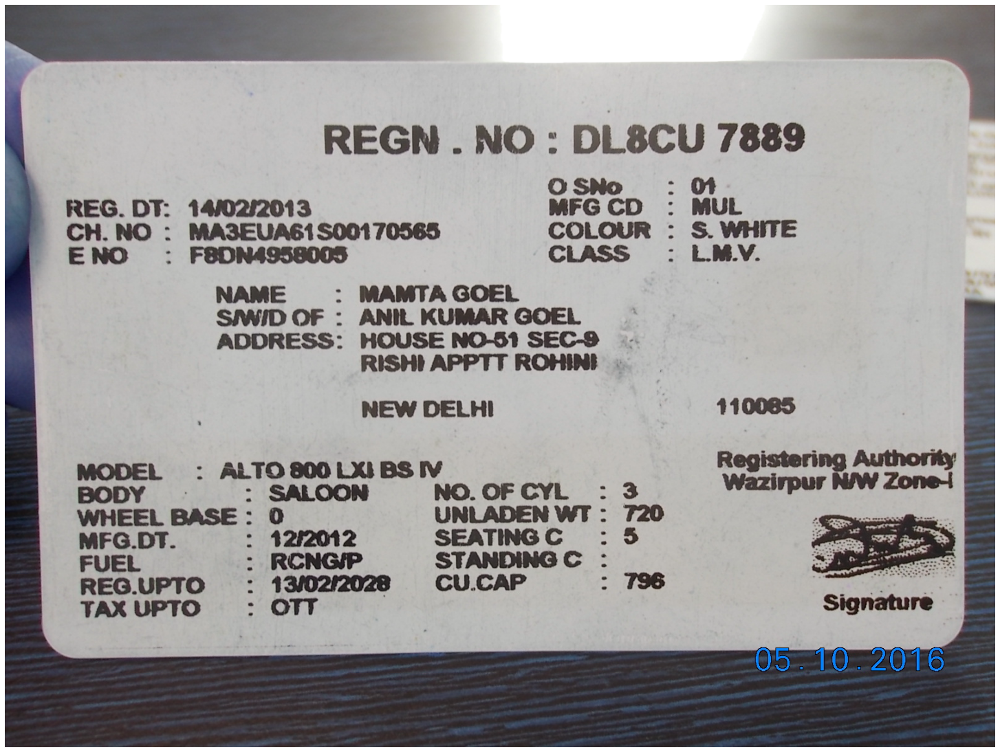

In [ ]:
display(result)

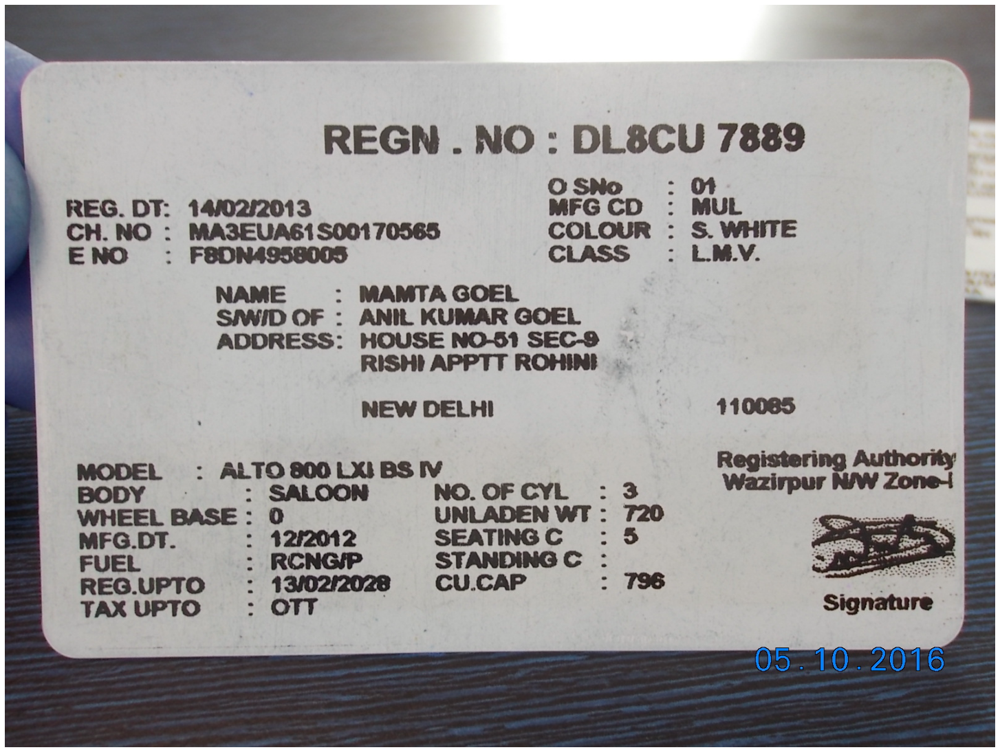

In [ ]:
display(img)

In [ ]:
cv2.imwrite("temp/result.jpg", result)

True

In [ ]:
from PIL import Image
file_name = "temp/result.jpg"
im = Image.open(file_name)
im.save("test-600.png", dpi=(900,900))

In [ ]:
img = cv2.imread("test-600.png")

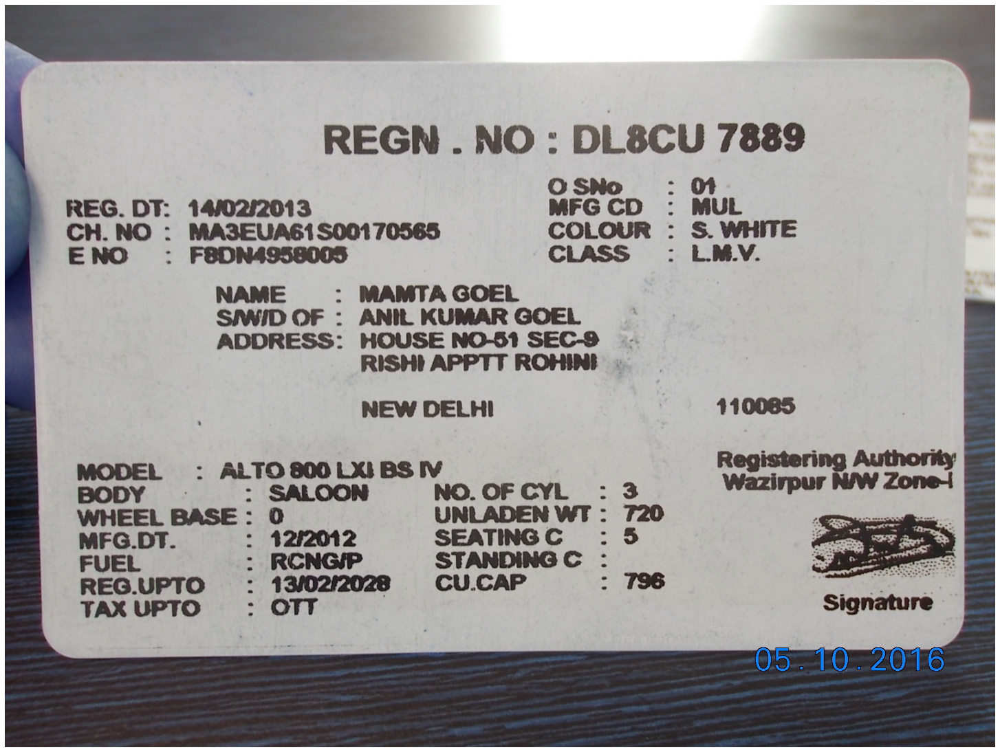

In [ ]:
display(img)

In [ ]:
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])
image_sharp = cv2.filter2D(src=img, ddepth=-1, kernel=kernel)

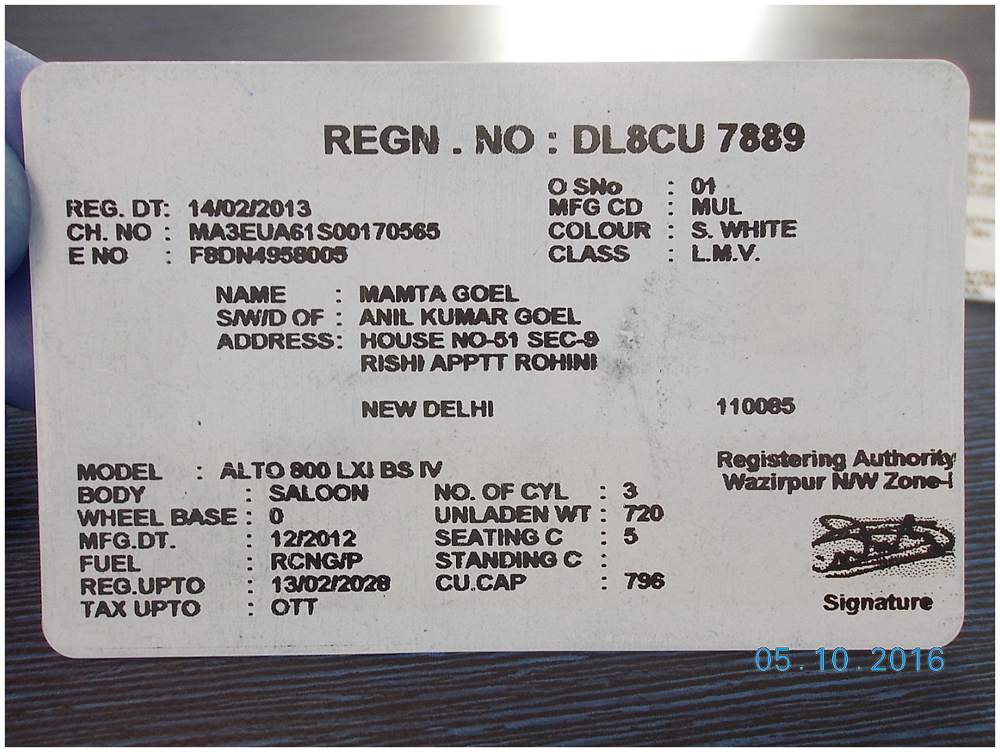

In [ ]:
display(image_sharp)

In [ ]:

output_org = reader.readtext(image_sharp)
data_org=data_frame(output_org, "Original")

In [ ]:
data_org

,Original
0,REGN
1,NO : DL8CU 7889
2,0 Sl
3,O}
4,REG DT:
5,14212013
6,MFG CD
7,MUL
8,CH: NO
9,MAZEUA6IS00170585
